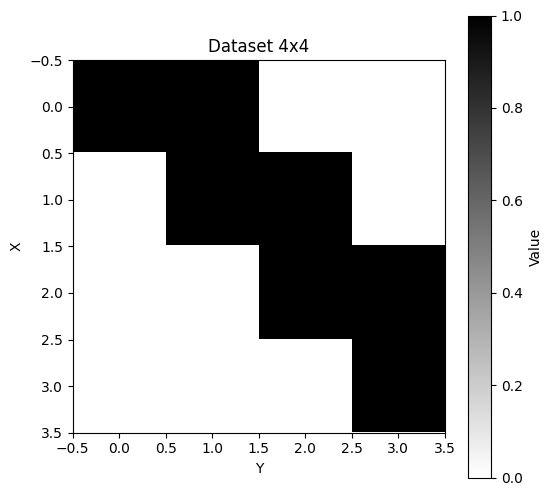

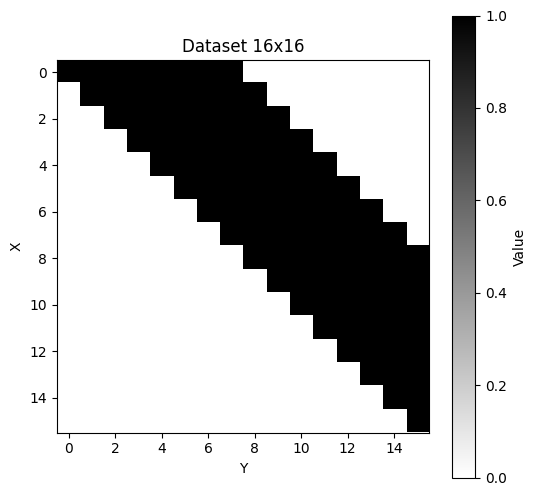

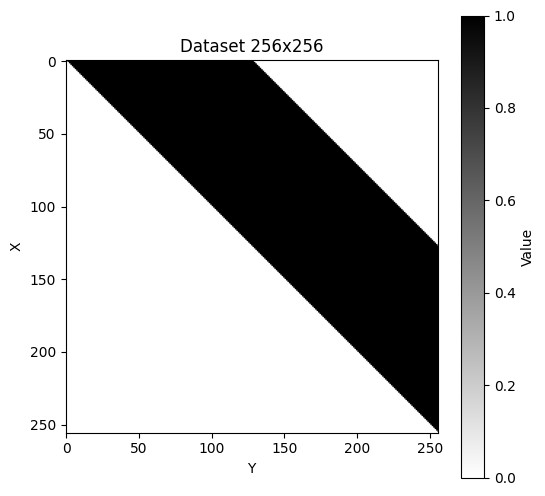

In [1]:
import numpy as np
import matplotlib.pyplot as plt

def generate_dataset(size):
    """Generates a dataset of the specified size where each row x starts with a/2 '1's at column y=x."""
    dataset = np.zeros((size, size), dtype=int)
    half_a = size // 2
    
    for i in range(size):
        end = min(i + half_a, size)  # Ensure we don't exceed the row size
        dataset[i, i:end] = 1
    
    return dataset

def visualize_dataset(dataset, title):
    """Visualizes the dataset as a heatmap."""
    plt.figure(figsize=(6, 6))
    plt.imshow(dataset, cmap='binary', origin='upper')
    plt.colorbar(label='Value')
    plt.title(title)
    plt.xlabel('Y')
    plt.ylabel('X')
    plt.show()

# Parameters for datasets
sizes = [4, 16, 256]  # Sizes of datasets

# Generate and visualize datasets
df = {size: generate_dataset(size) for size in sizes}
for size, data in df.items():
    visualize_dataset(data, f'Dataset {size}x{size}')


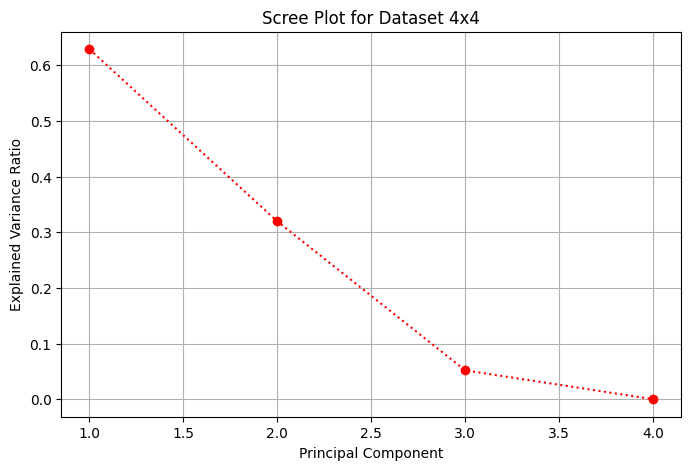

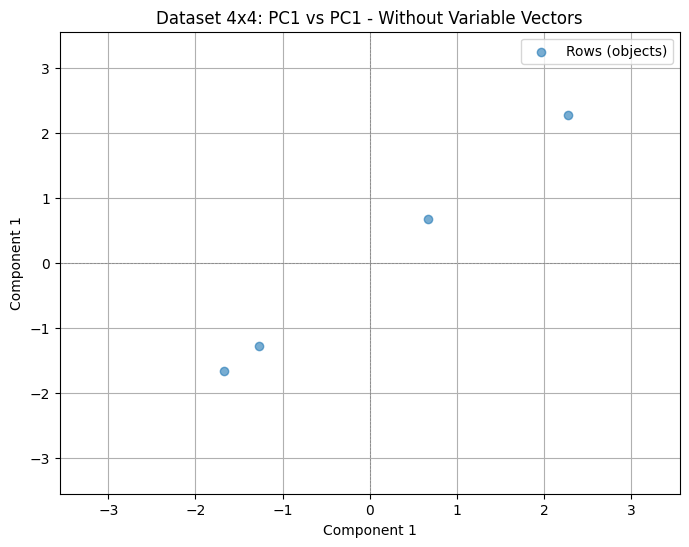

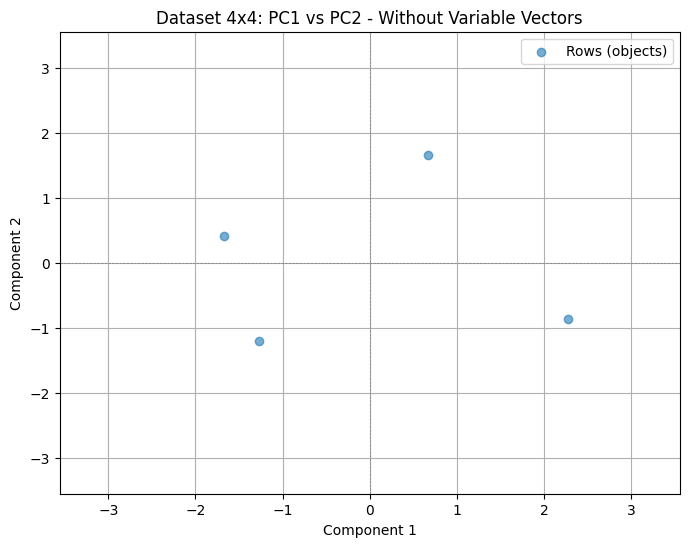

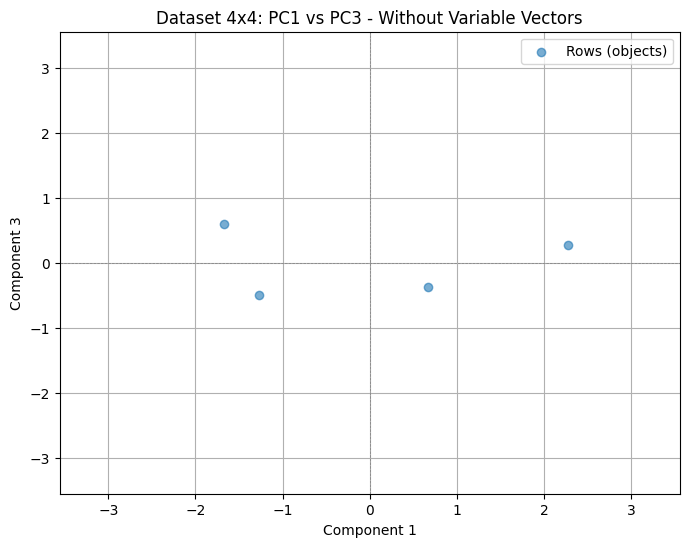

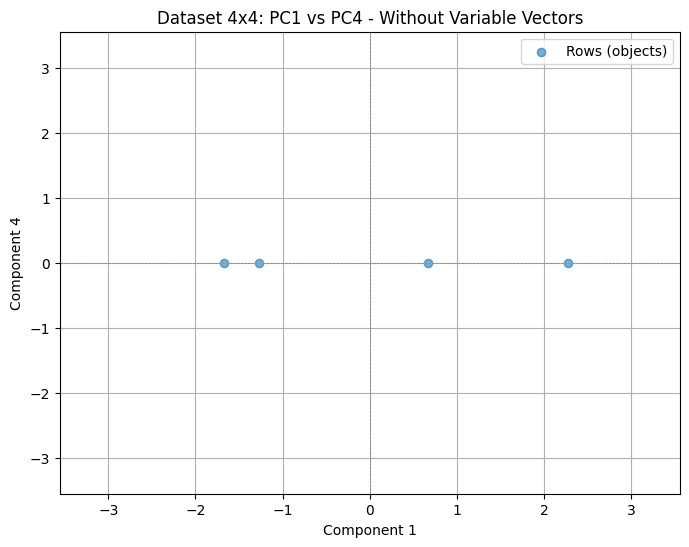

...

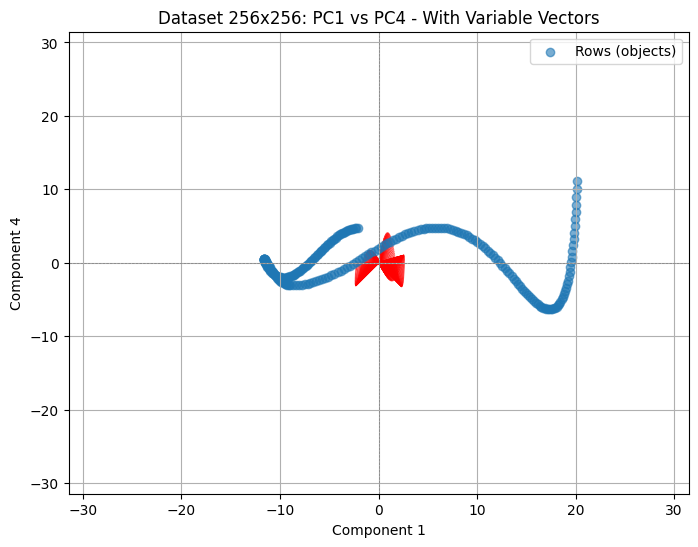

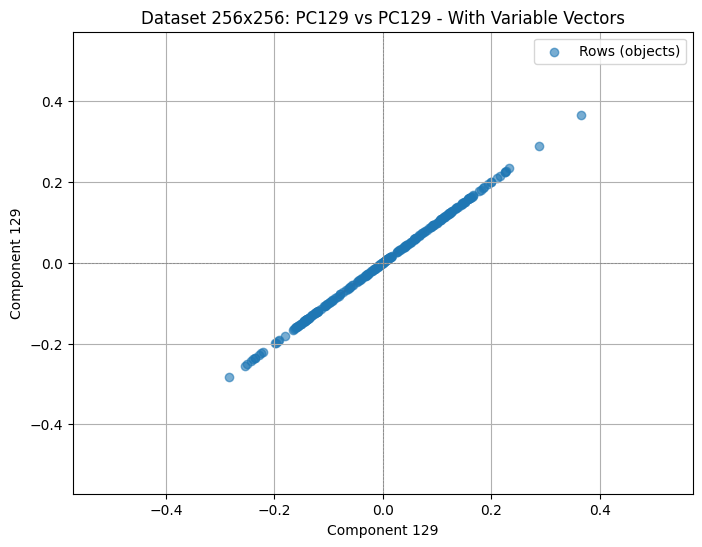

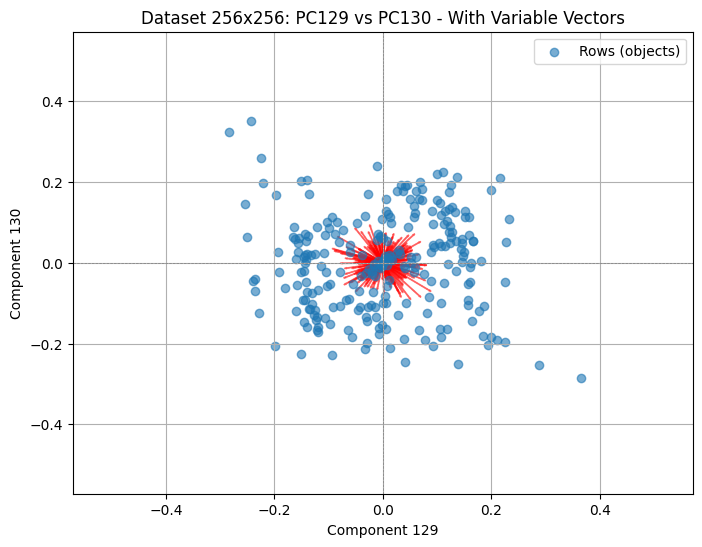

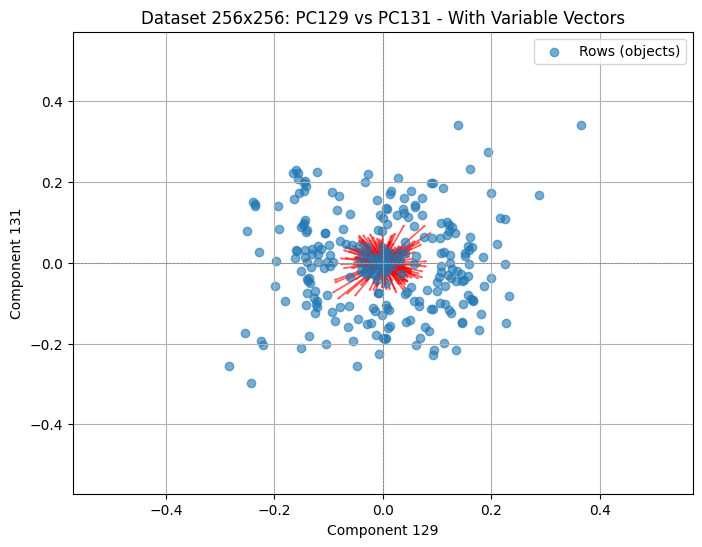

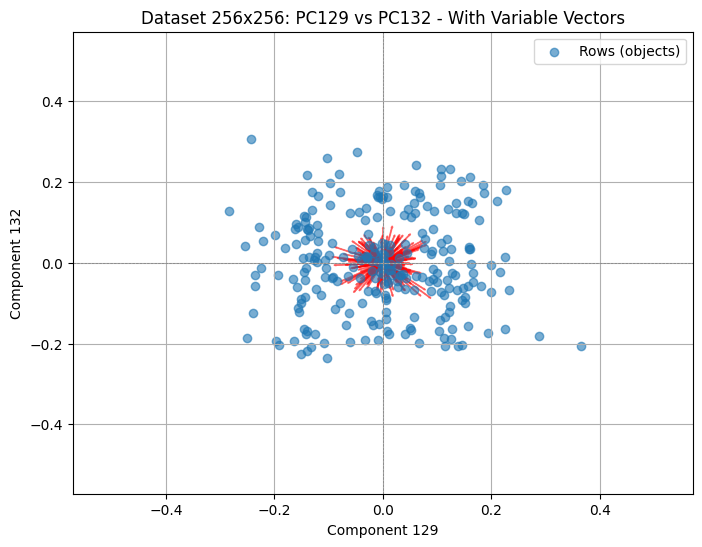

In [2]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

def perform_pca_and_visualize(dataset, a, c=129, show_vectors=False):
    size = dataset.shape[0]
    
    pca = PCA()
    standardized_data = (dataset - np.mean(dataset, axis=0)) / np.std(dataset, axis=0)
    components = pca.fit_transform(standardized_data)
    explained_variance_ratio = pca.explained_variance_ratio_
    
    # Scree plot
    plt.figure(figsize=(8, 5))
    plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, marker='o', linestyle=':', color='r')
    plt.title(f"Scree Plot for Dataset {size}x{size}")
    plt.xlabel("Principal Component")
    plt.ylabel("Explained Variance Ratio")
    plt.grid()
    plt.show()

    # Visualization function for principal components
    def plot_principal_components(data, components_range, title, vectors=False):
        a_max = np.max(np.abs(data[:, components_range[0]])) * 1.25
        b_max = np.max(np.abs(data[:, components_range[1]])) * 1.25 
        data_max = np.max(np.array(a_max, b_max)) * 1.25
        
        plt.figure(figsize=(8, 6))
        if vectors:
            for i, (comp1, comp2) in enumerate(zip(pca.components_[components_range[0]], pca.components_[components_range[1]])):
                plt.arrow(0, 0, comp1 * data_max, comp2 * data_max, color='r', alpha=0.5)
                # plt.text(comp1 * 1.2, comp2 * 1.2, f"Var{i+1}", color='r', fontsize=10)

        plt.scatter(data[:, components_range[0]], data[:, components_range[1]], alpha=0.6, label="Rows (objects)")

        plt.title(title)
        plt.xlabel(f"Component {components_range[0] + 1}")
        plt.ylabel(f"Component {components_range[1] + 1}")
        plt.xlim([-data_max, data_max])
        plt.ylim([-data_max, data_max])
        plt.axhline(0, color='gray', linewidth=0.5, linestyle='--')
        plt.axvline(0, color='gray', linewidth=0.5, linestyle='--')
        plt.grid()
        plt.legend()
        plt.show()
    
    # Visualize first a components
    for i in range(1, a + 1):
        plot_principal_components(components, (0, i - 1),
                                  f"Dataset {size}x{size}: PC1 vs PC{i} - {'With' if show_vectors else 'Without'} Variable Vectors",
                                  vectors=show_vectors)
    
    # Visualize components from c to c+a
    if c + a <= size:
        for i in range(c, c + a):
            plot_principal_components(components, (c - 1, i - 1),
                                      f"Dataset {size}x{size}: PC{c} vs PC{i} - {'With' if show_vectors else 'Without'} Variable Vectors",
                                      vectors=show_vectors)


# Parameters for PCA visualization
a = 4  # Number of principal components to visualize
c = 129  # Starting principal component for c-range visualization

# Visualize for each dataset
for size, data in df.items():
    perform_pca_and_visualize(data, a=a, c=c, show_vectors=False)
    perform_pca_and_visualize(data, a=a, c=c, show_vectors=True)

C:\Users\root\AppData\Local\Programs\Python\Python310\lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
C:\Users\root\AppData\Local\Programs\Python\Python310\lib\site-packages\umap\umap_.py:2462: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


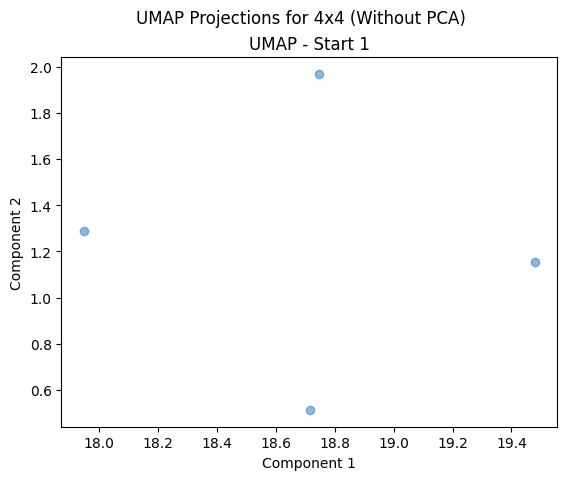

C:\Users\root\AppData\Local\Programs\Python\Python310\lib\site-packages\umap\umap_.py:2462: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


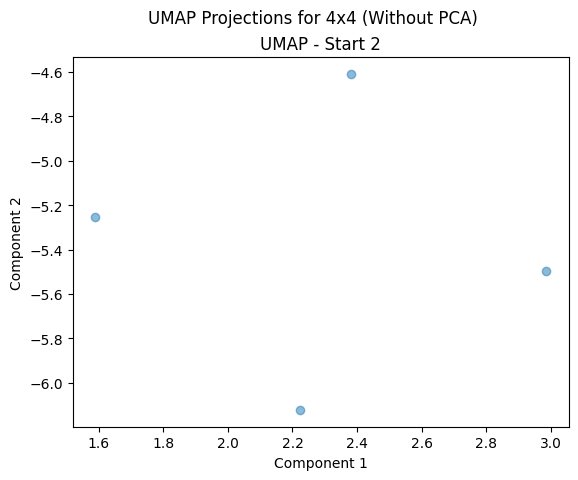

C:\Users\root\AppData\Local\Programs\Python\Python310\lib\site-packages\umap\umap_.py:2462: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


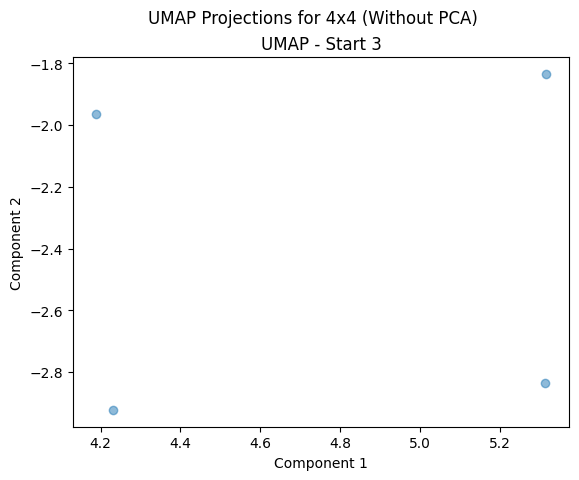

C:\Users\root\AppData\Local\Programs\Python\Python310\lib\site-packages\umap\umap_.py:2462: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


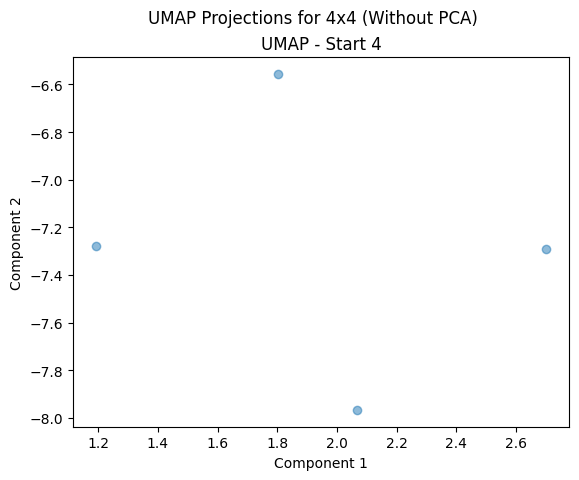

C:\Users\root\AppData\Local\Programs\Python\Python310\lib\site-packages\umap\umap_.py:2462: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


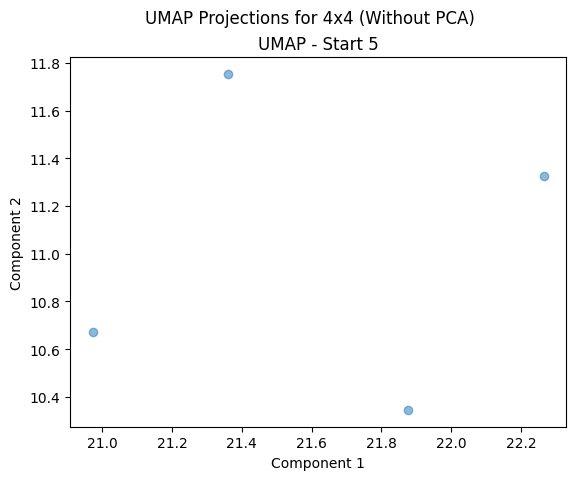

C:\Users\root\AppData\Local\Programs\Python\Python310\lib\site-packages\umap\umap_.py:2462: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


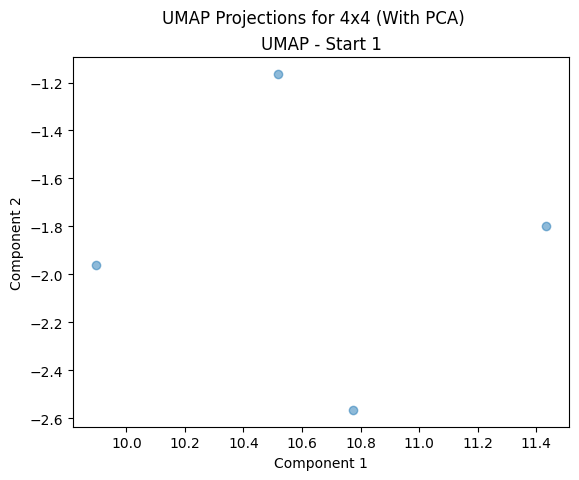

C:\Users\root\AppData\Local\Programs\Python\Python310\lib\site-packages\umap\umap_.py:2462: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


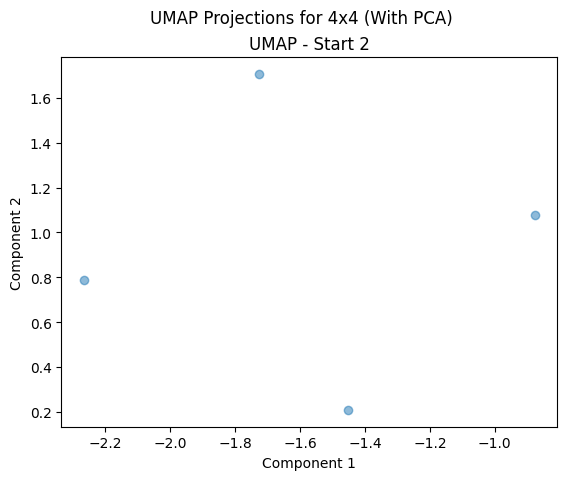

C:\Users\root\AppData\Local\Programs\Python\Python310\lib\site-packages\umap\umap_.py:2462: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


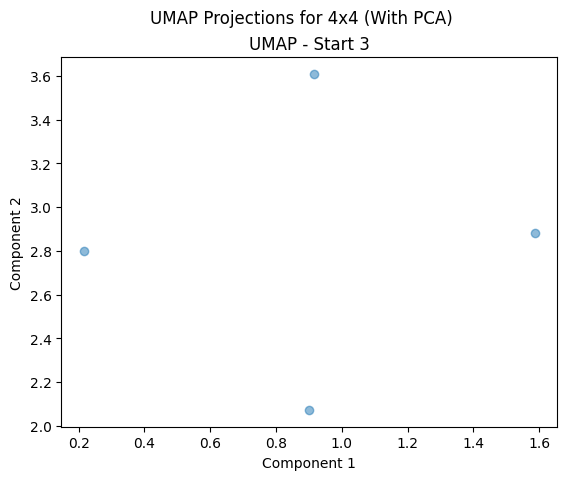

C:\Users\root\AppData\Local\Programs\Python\Python310\lib\site-packages\umap\umap_.py:2462: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


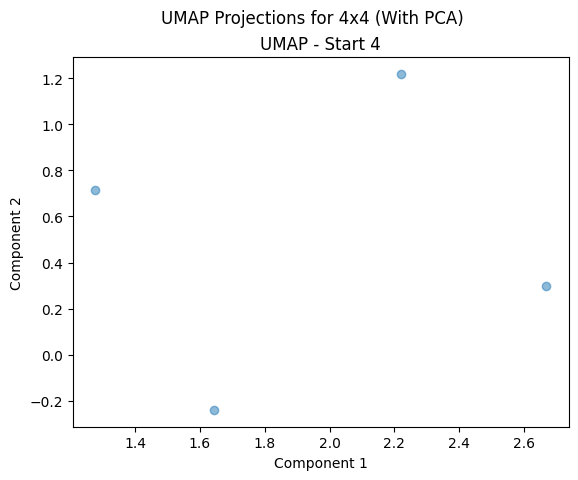

C:\Users\root\AppData\Local\Programs\Python\Python310\lib\site-packages\umap\umap_.py:2462: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


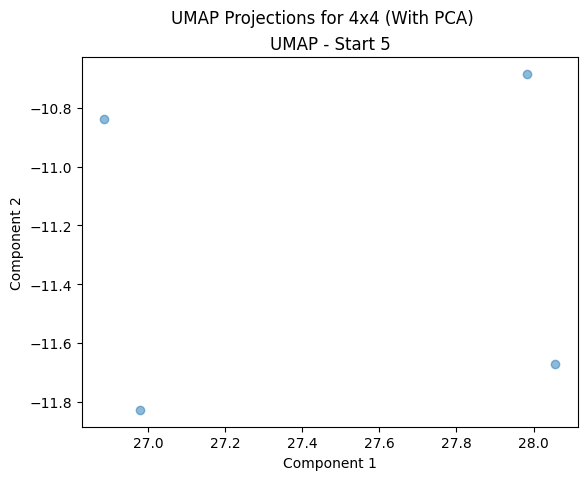

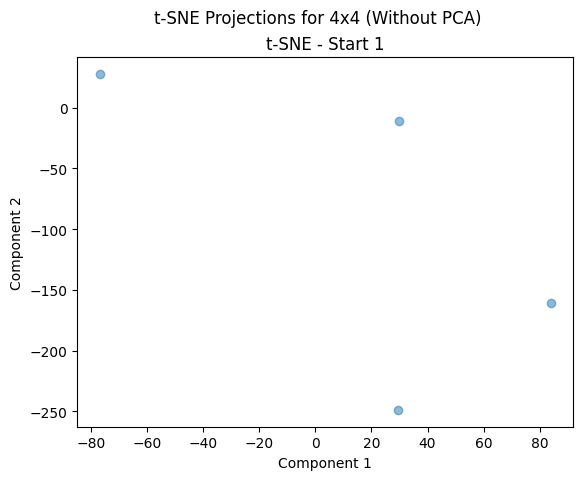

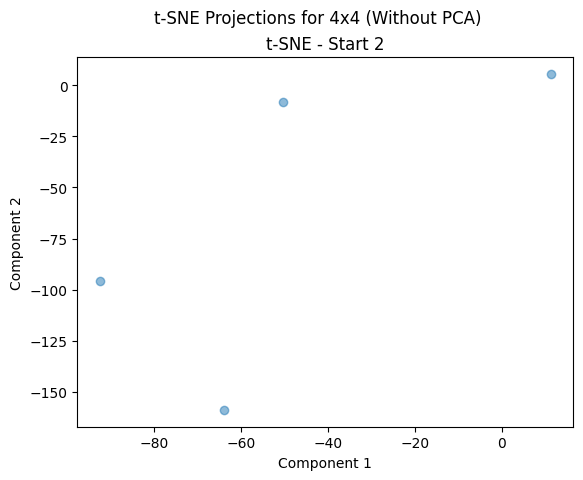

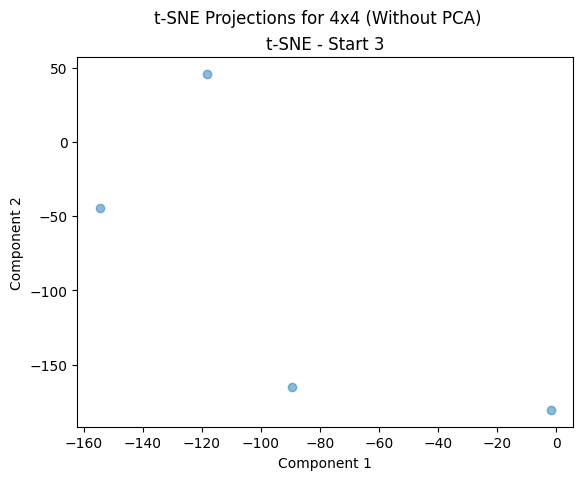

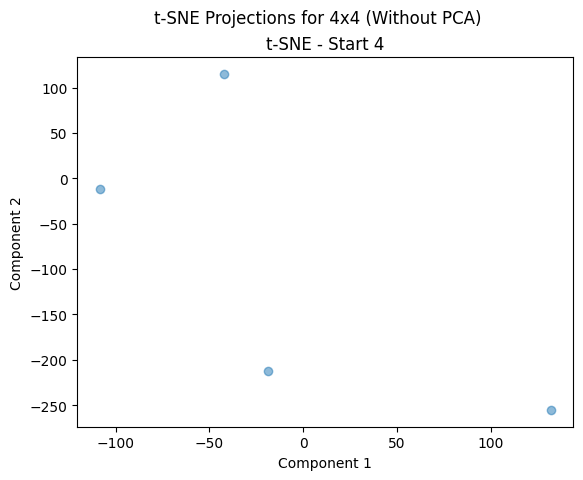

...

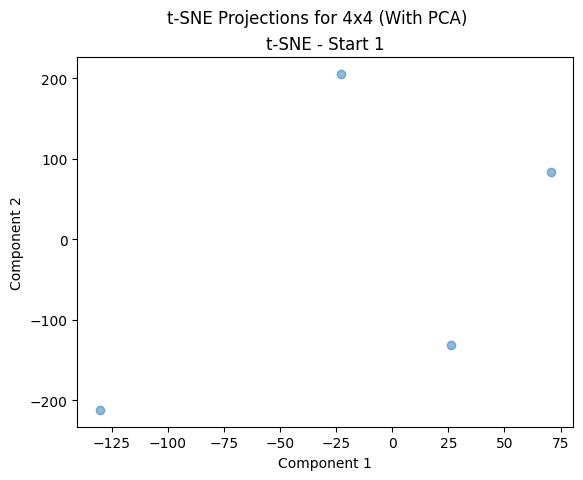

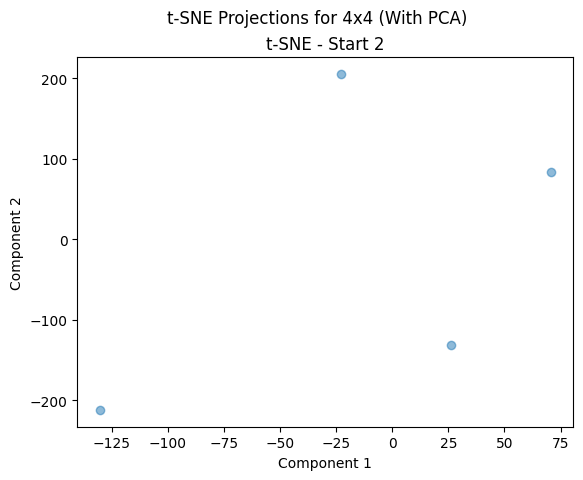

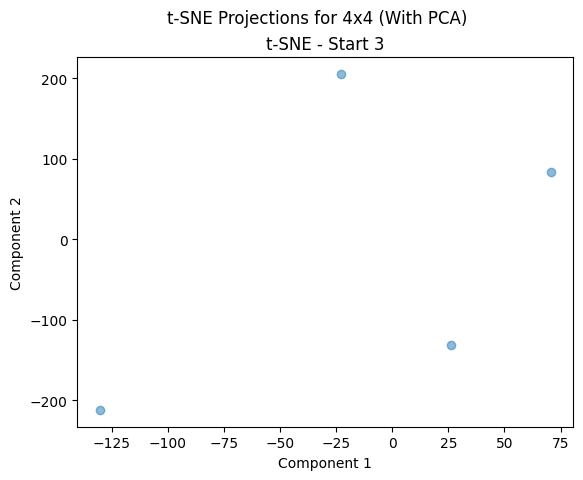

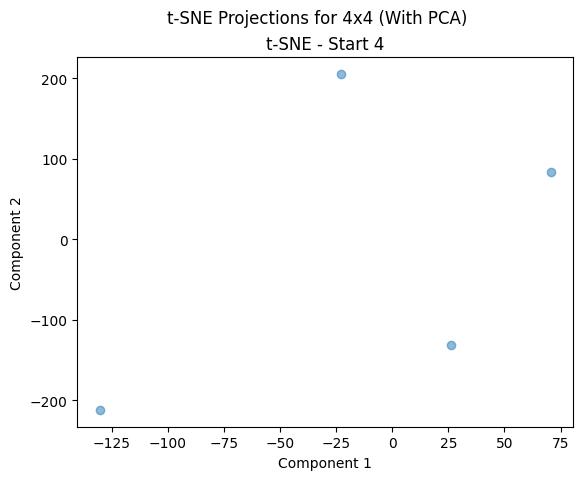

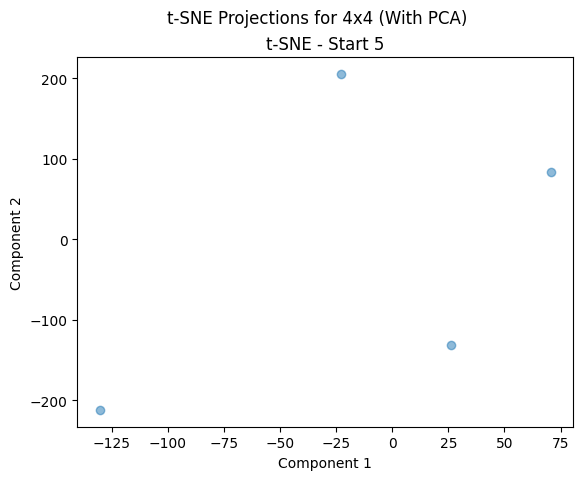

C:\Users\root\AppData\Local\Programs\Python\Python310\lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


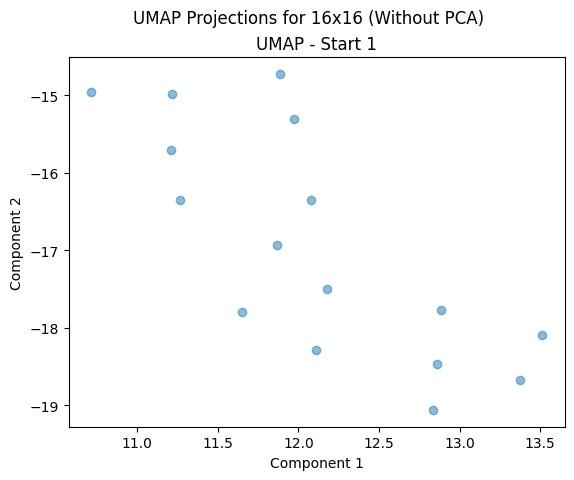

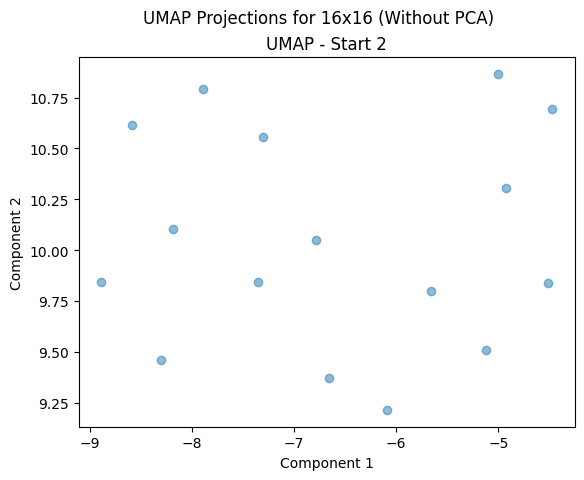

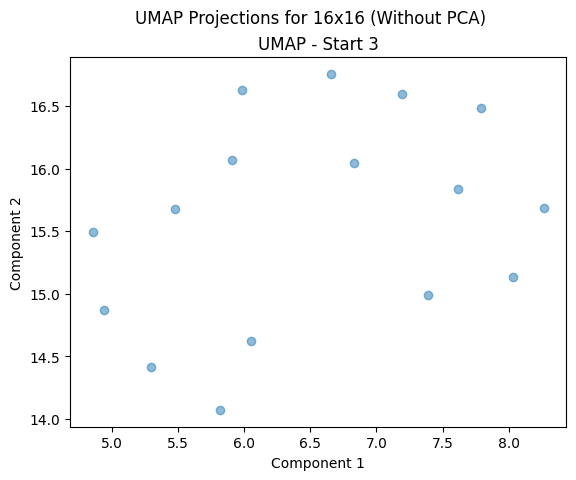

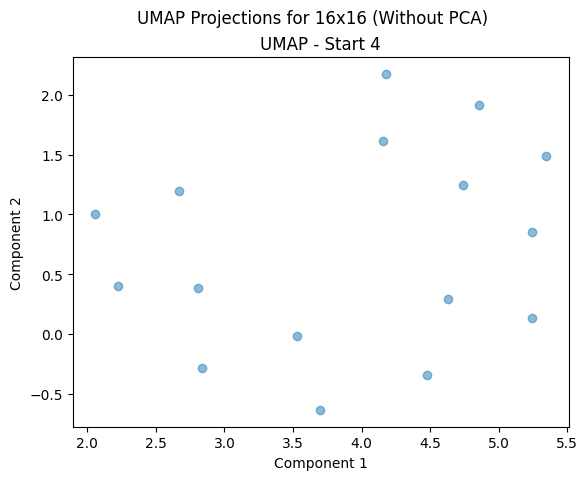

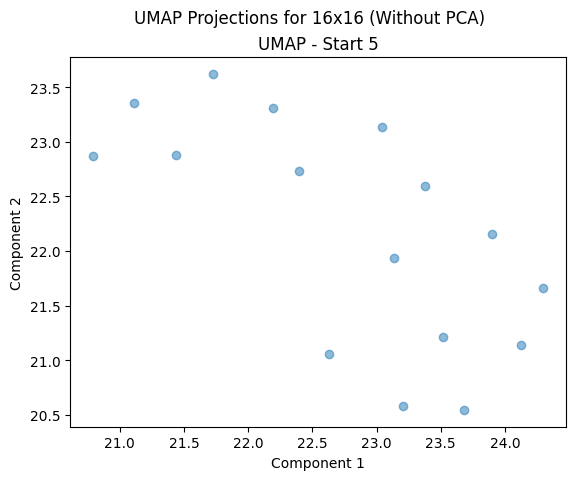

...

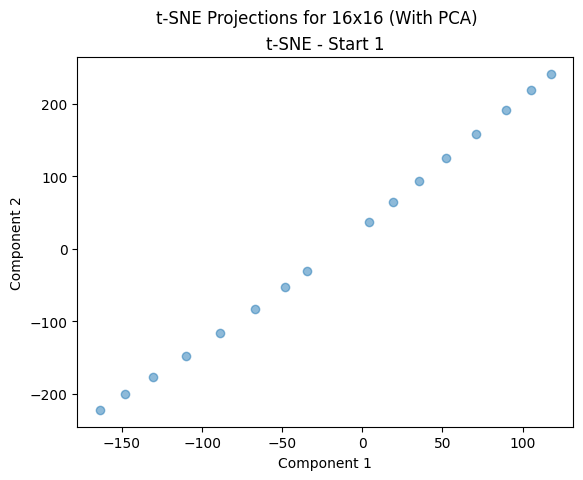

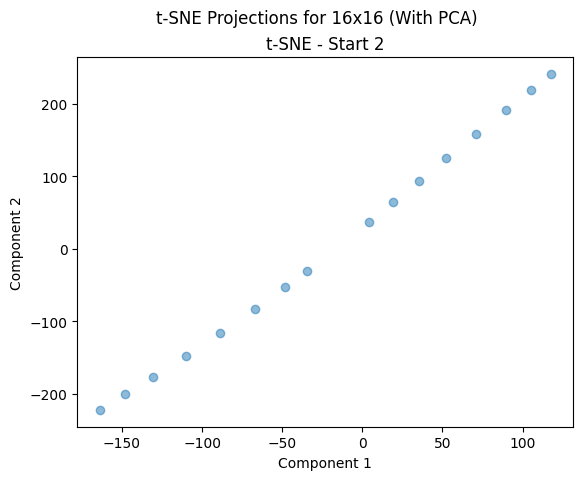

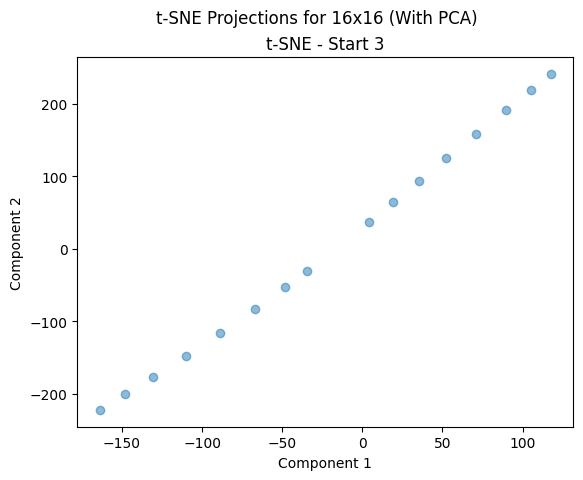

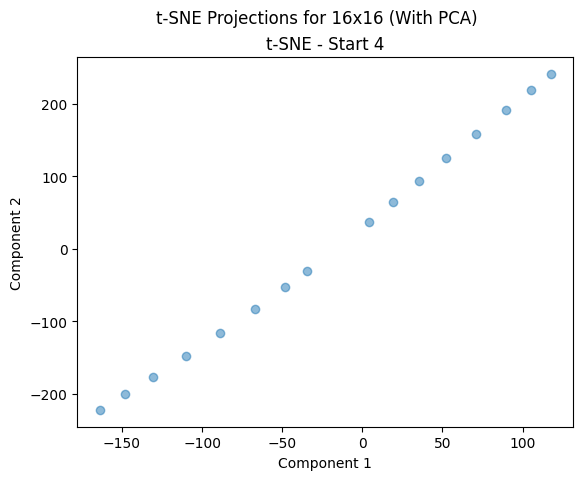

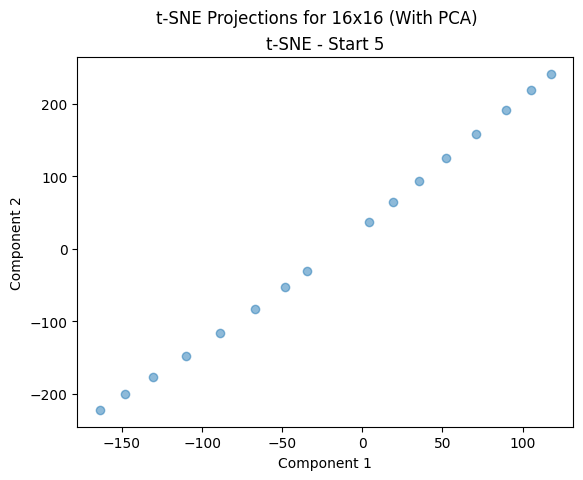

C:\Users\root\AppData\Local\Programs\Python\Python310\lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


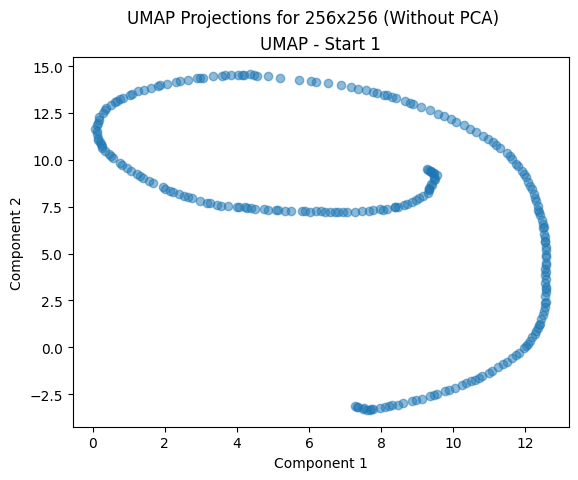

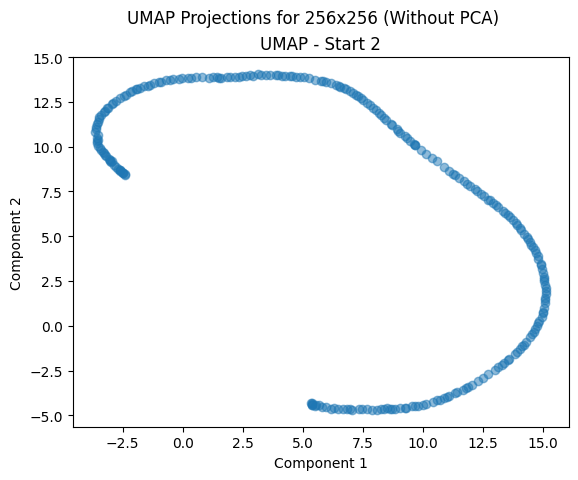

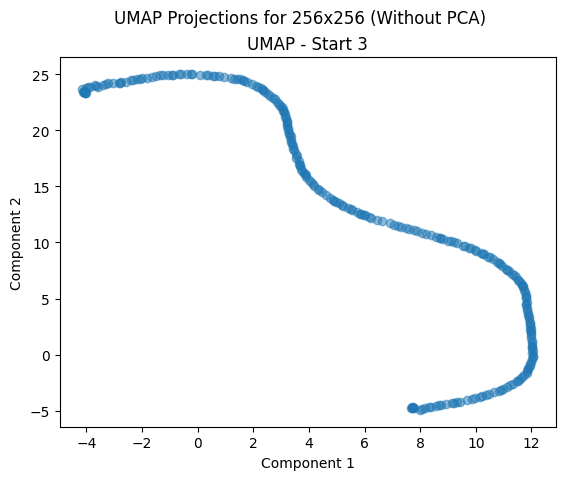

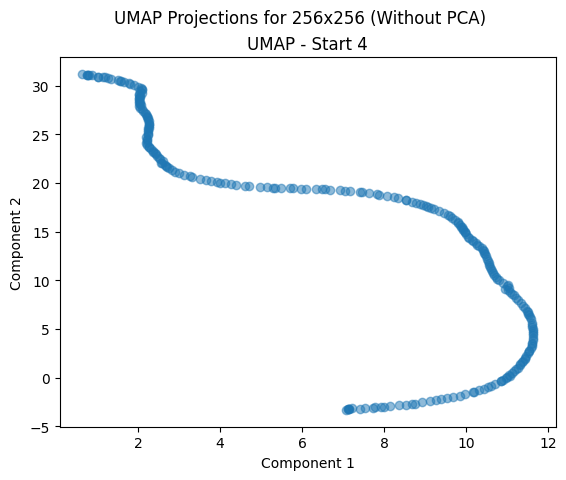

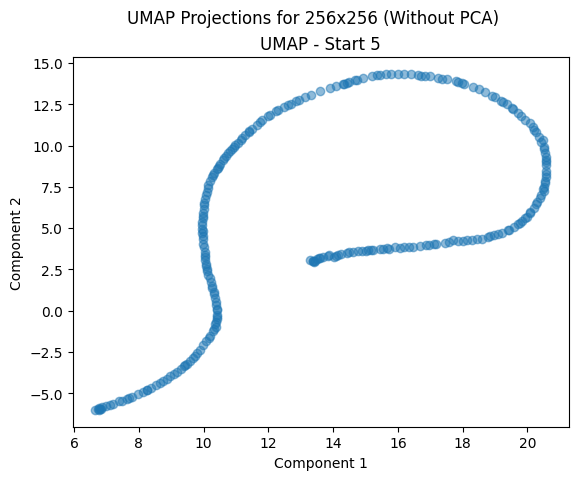

...

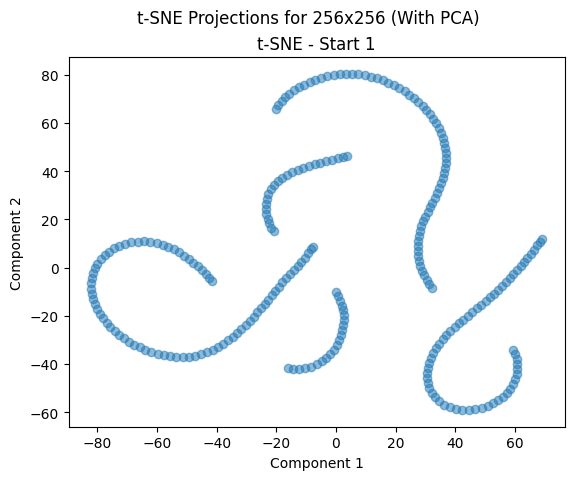

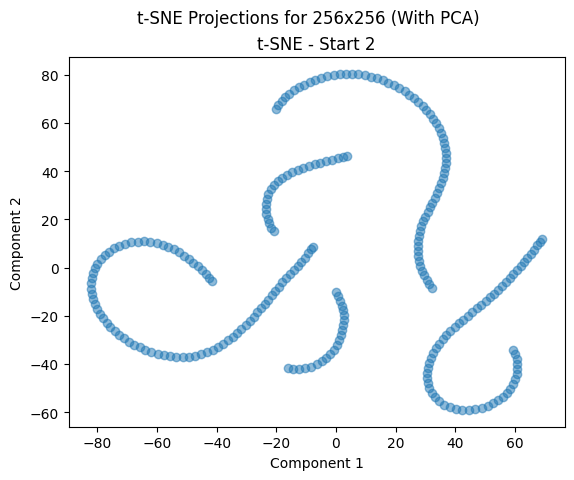

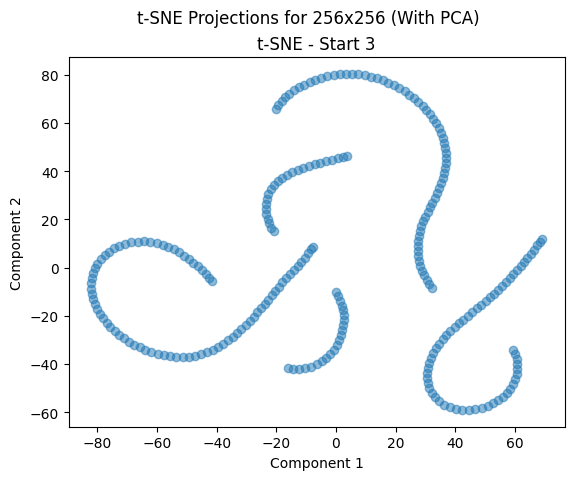

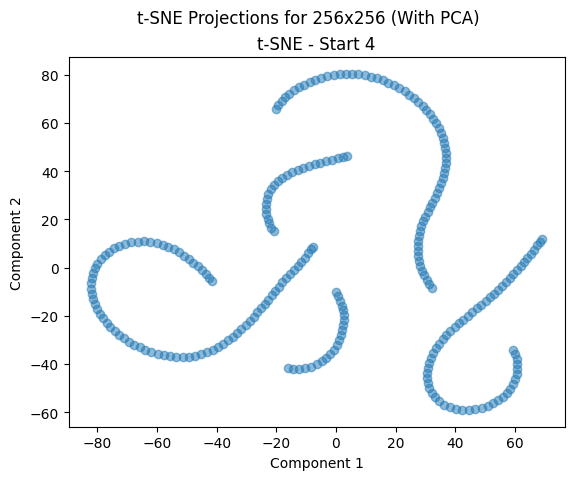

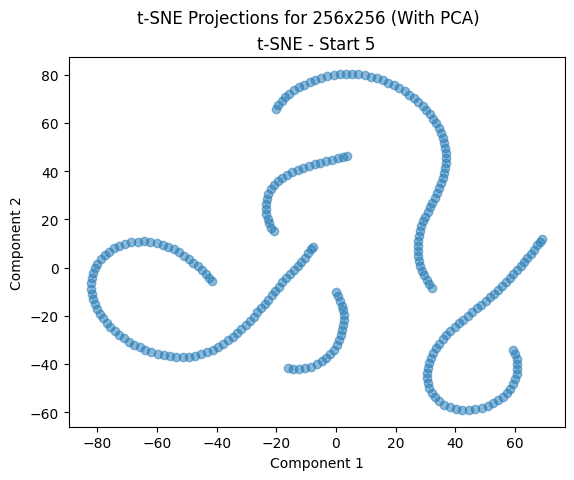

In [3]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
import pacmap

# Функция для выполнения PCA и визуализации
def perform_pca(df_a, dataset_name, n_components=2):
    pca = PCA(n_components=n_components)
    df_a_pca = pca.fit_transform(df_a)
    return df_a_pca

# Функция для визуализации проекций
def visualize_projections(df_a, df_a_pca, dataset_name, n_starts=5):
    methods = {
        'UMAP': umap.UMAP(n_components=2, n_jobs = len(df_a), random_state=None),
        'PacMAP': pacmap.PaCMAP(n_components=2, n_neighbors=2, random_state=None),
        't-SNE': TSNE(n_components=2, perplexity=2, random_state=None)
    }
    
    for method_name, method in methods.items():
        for i in range(n_starts):
            if method_name == 'PacMAP':
                if df_a.shape[0] < 10:
                    break
                    
            method.random_state = np.random.randint(0, 100000)
            projection = method.fit_transform(df_a)
            plt.scatter(projection[:, 0], projection[:, 1], alpha=0.5)
            plt.title(f'{method_name} - Start {i+1}')
            plt.xlabel('Component 1')
            plt.ylabel('Component 2')
        
            plt.suptitle(f'{method_name} Projections for {dataset_name} (Without PCA)')
            plt.show()
        
        for i in range(n_starts):
            if method_name == 'PacMAP':
                if df_a.shape[0] < 10:
                    break
            method.random_state = np.random.randint(0, 100000)
            projection = method.fit_transform(df_a_pca)
            plt.scatter(projection[:, 0], projection[:, 1], alpha=0.5)
            plt.title(f'{method_name} - Start {i+1}')
            plt.xlabel('Component 1')
            plt.ylabel('Component 2')
        
            plt.suptitle(f'{method_name} Projections for {dataset_name} (With PCA)')
            plt.show()

# Выполнение PCA и визуализация проекций для каждого датасета
df_a_4x4_pca = perform_pca(df[4], '4x4', n_components=2)
df_a_16x16_pca = perform_pca(df[16], '16x16', n_components=2)
df_a_256x256_pca = perform_pca(df[256], '256x256', n_components=2)

visualize_projections(df[4], df_a_4x4_pca, '4x4')
visualize_projections(df[16], df_a_16x16_pca, '16x16')
visualize_projections(df[256], df_a_256x256_pca, '256x256')

C:\Users\root\AppData\Roaming\Python\Python310\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


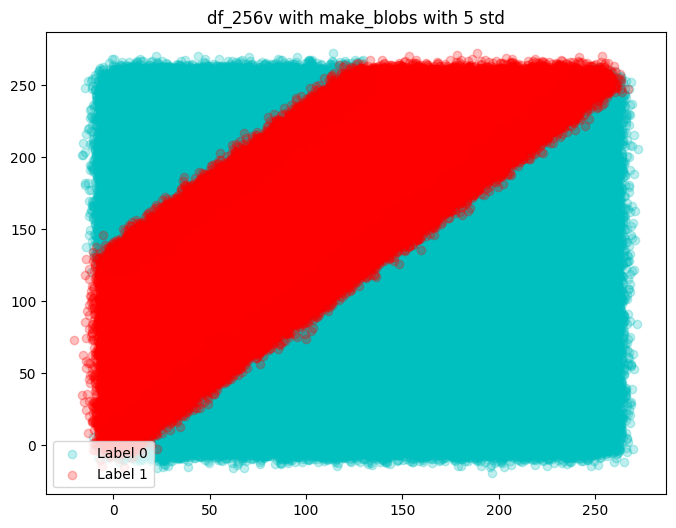

In [9]:
from sklearn.datasets import make_blobs
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def generate_blobs(df, n_samples=10, cluster_std=10):
    data = []
    labels = []
    for x in range(df.shape[0]):
        for y in range(df.shape[1]):
            value = df[x, y]
            blobs, _ = make_blobs(n_samples=n_samples, centers=[(x, y)], cluster_std=cluster_std, n_features=2)
            data.extend(blobs)
            labels.extend([value] * n_samples)
    return pd.DataFrame(data, columns=['x', 'y']), labels

# Assuming df[256] is a 2D array or similar structure
cluster_std = 5
df_256v, labels_256v = generate_blobs(df[256], n_samples=10, cluster_std=cluster_std)

# Add the labels as a new column to df_256v
df_256v['label'] = labels_256v

# Create a scatter plot with matplotlib
palette = {0: 'c', 1: 'red'}
plt.figure(figsize=(8, 6))
for label in set(labels_256v):
    # Filter points for the current label
    points = df_256v[df_256v['label'] == label]
    plt.scatter(points['x'], points['y'], alpha=0.25, color=palette[label], label=f'Label {label}')

# Add title and legend
plt.title(f'df_256v with make_blobs with {cluster_std} std')
plt.legend()
plt.show()

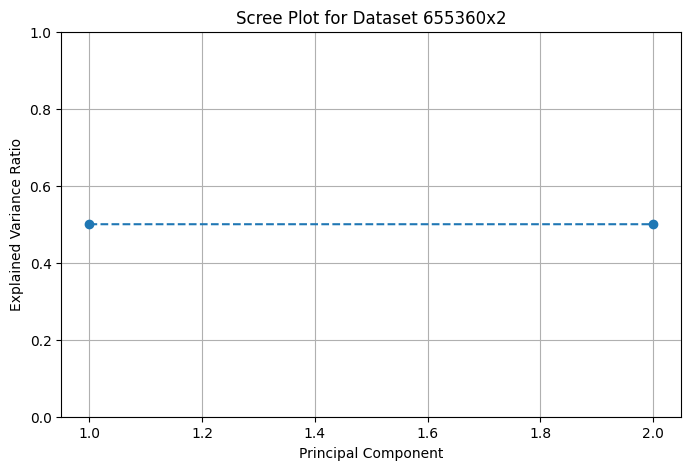

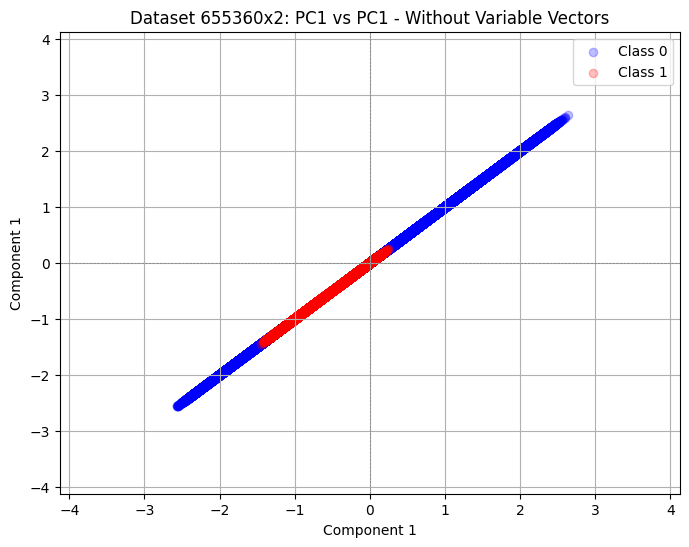

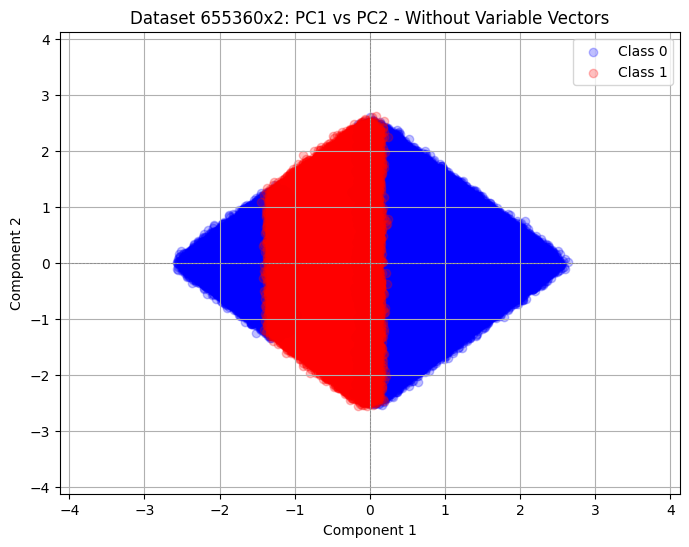

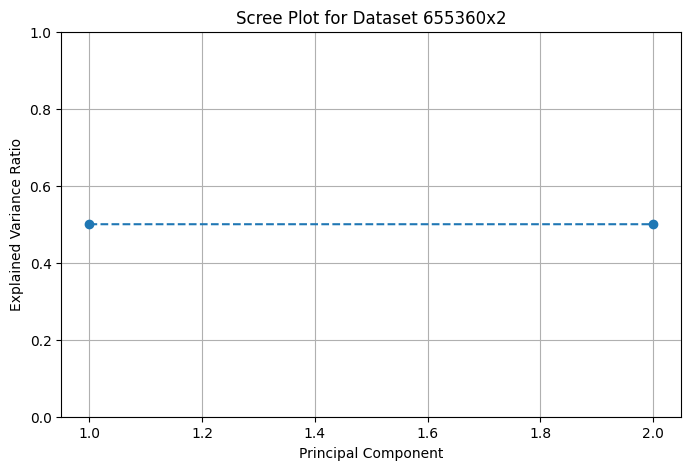

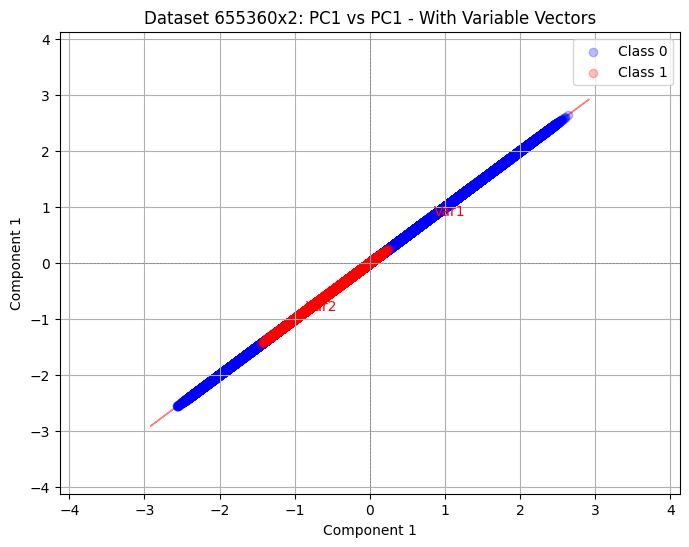

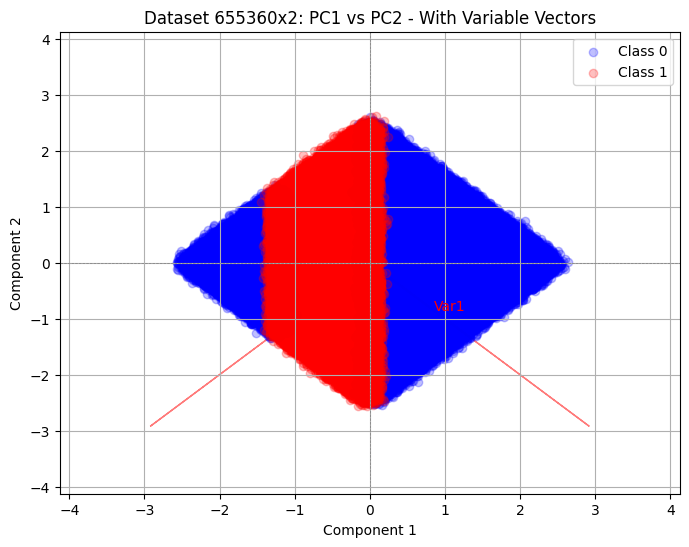

In [51]:
def perform_pca_and_visualize_no128(dataset, labels, a, show_vectors=False):
    size = dataset.shape[0]
    
    pca = PCA()
    standardized_data = (dataset - np.mean(dataset, axis=0)) / np.std(dataset, axis=0)
    components = pca.fit_transform(standardized_data)
    explained_variance_ratio = pca.explained_variance_ratio_
    
    # Scree plot
    plt.figure(figsize=(8, 5))
    plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, marker='o', linestyle='--')
    plt.title(f"Scree Plot for Dataset {size}x{2}")
    plt.xlabel("Principal Component")
    plt.ylim([0, 1])
    plt.ylabel("Explained Variance Ratio")
    plt.grid()
    plt.show()

    # Visualization function for principal components
    def plot_principal_components(data, labels, components_range, title, vectors=False):
        a_max = np.max(np.abs(data[:, components_range[0]])) * 1.25
        b_max = np.max(np.abs(data[:, components_range[1]])) * 1.25 
        data_max = np.max(np.array(a_max, b_max)) * 1.25
        
        plt.figure(figsize=(8, 6))
        if vectors:
            for i, (comp1, comp2) in enumerate(zip(pca.components_[components_range[0]], pca.components_[components_range[1]])):
                plt.arrow(0, 0, comp1 * data_max, comp2 * data_max, color='r', alpha=0.5)
                plt.text(comp1 * 1.2, comp2 * 1.2, f"Var{i+1}", color='r', fontsize=10)

        for label in np.unique(labels):
            color = 'blue' if label == 0 else 'red'
            plt.scatter(data[labels == label, components_range[0]], data[labels == label, components_range[1]], 
                        color=color, alpha=0.25, label=f'Class {label}')

        plt.title(title)
        plt.xlabel(f"Component {components_range[0] + 1}")
        plt.ylabel(f"Component {components_range[1] + 1}")
        plt.xlim([-data_max, data_max])
        plt.ylim([-data_max, data_max])
        plt.axhline(0, color='gray', linewidth=0.5, linestyle='--')
        plt.axvline(0, color='gray', linewidth=0.5, linestyle='--')
        plt.grid()
        plt.legend()
        plt.show()
    
    # Visualize first a components
    for i in range(1, a + 1):
        plot_principal_components(components, labels, (0, i - 1),
                                  f"Dataset {size}x{2}: PC1 vs PC{i} - {'With' if show_vectors else 'Without'} Variable Vectors",
                                  vectors=show_vectors)

# Parameters for PCA visualization
a = 2  # Number of principal components to visualize

# Visualize for df_256v
perform_pca_and_visualize_no128(df_256v[['x', 'y']], labels_256v, a=a, show_vectors=False)
perform_pca_and_visualize_no128(df_256v[['x', 'y']], labels_256v, a=a, show_vectors=True)

In [58]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import umap
import pacmap
from sklearn.manifold import TSNE
import seaborn as sns

# Функция для визуализации проекций
def visualize_projections_new(df_a, df_a_pca, labels, dataset_name, n_starts=5, n_neighbors=2):
    methods = {
        'UMAP': umap.UMAP(n_components=2, n_jobs=len(df_a), random_state=None),
        'PacMAP': pacmap.PaCMAP(n_components=2, n_neighbors=2, random_state=None),
        't-SNE': TSNE(n_components=2, perplexity=3, random_state=None)
    }
    
    for method_name, method in methods.items():
        for i in range(n_starts):
            if method_name == 'PacMAP' and df_a.shape[0] < 10:
                break
            
            method.random_state = np.random.randint(0, 1000)
            projection = method.fit_transform(df_a)
            plt.figure(figsize=(8, 6))
            sns.scatterplot(x=projection[:, 0], y=projection[:, 1], hue=labels, palette='tab10', alpha=0.25)
            plt.title(f'{method_name} - Start {i+1} (Without PCA)')
            plt.xlabel('Component 1')
            plt.ylabel('Component 2')
            plt.legend()
            plt.suptitle(f'{method_name} Projections for {dataset_name} (Without PCA)')
            plt.show()
        
        for i in range(n_starts):
            if method_name == 'PacMAP' and df_a.shape[0] < 10:
                break
            
            method.random_state = np.random.randint(0, 1000)
            projection = method.fit_transform(df_a_pca)
            plt.figure(figsize=(8, 6))
            sns.scatterplot(x=projection[:, 0], y=projection[:, 1], hue=labels, palette='tab10', alpha=0.25)
            plt.title(f'{method_name} - Start {i+1} (With PCA)')
            plt.xlabel('Component 1')
            plt.ylabel('Component 2')
            plt.legend()
            plt.suptitle(f'{method_name} Projections for {dataset_name} (With PCA)')
            plt.show()

In [62]:
# df_pca = perform_pca(df_256v_np, '655360x2')

# # Визуализация проекций
# visualize_projections_new(df_256v_np, df_pca, labels_256v, '655360x2', n_starts=1, n_neighbors=2)

In [30]:
def show_plot(df, name):
    dataset_shape = df.shape
    num_features = df.shape[1] - 1
    target_classes_count = df['Cover_Type'].value_counts()
    missing_percentage = df.isnull().mean() * 100
    description = df.describe()

    print(dataset_shape, '\n', f'Num of features {num_features}\n', target_classes_count,
      f' Missing percentage: {missing_percentage}\n', description)
    correlation_matrix = df.corr()
    plt.figure(figsize=(8, 6))
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
    plt.title(f'Correlation Matrix of {name}')
    plt.show()
    sns.pairplot(df, hue='Cover_Type', diag_kind='kde')
    plt.show()

In [42]:
file_path = './data/forest.csv'

# Загрузите данные в DataFrame
soil_types = [f'Soil_Type{i+1}' for i in range(40)]
wild = [f'Wilderness_Area{i+1}' for i in range(4)]
df = pd.read_csv(file_path)
df = df.drop(columns=soil_types)
df = df.drop(columns=wild)
df = df.drop(columns=['Id'])
df.head()

['Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6', 'Soil_Type7', 'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14', 'Soil_Type15', 'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40']


,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Cover_Type
0,2596,51,3,258,0,510,221,232,148,6279,5
1,2590,56,2,212,-6,390,220,235,151,6225,5
2,2804,139,9,268,65,3180,234,238,135,6121,2
3,2785,155,18,242,118,3090,238,238,122,6211,2
4,2595,45,2,153,-1,391,220,234,150,6172,5


(15120, 11) 
 Num of features 10
 Cover_Type
5    2160
2    2160
1    2160
7    2160
3    2160
6    2160
4    2160
Name: count, dtype: int64  Missing percentage: Elevation                             0.0
Aspect                                0.0
Slope                                 0.0
Horizontal_Distance_To_Hydrology      0.0
Vertical_Distance_To_Hydrology        0.0
Horizontal_Distance_To_Roadways       0.0
Hillshade_9am                         0.0
Hillshade_Noon                        0.0
Hillshade_3pm                         0.0
Horizontal_Distance_To_Fire_Points    0.0
Cover_Type                            0.0
dtype: float64
           Elevation        Aspect         Slope  \
count  15120.000000  15120.000000  15120.000000   
mean    2749.322553    156.676653     16.501587   
std      417.678187    110.085801      8.453927   
min     1863.000000      0.000000      0.000000   
25%     2376.000000     65.000000     10.000000   
50%     2752.000000    126.000000     15.000000   
75%

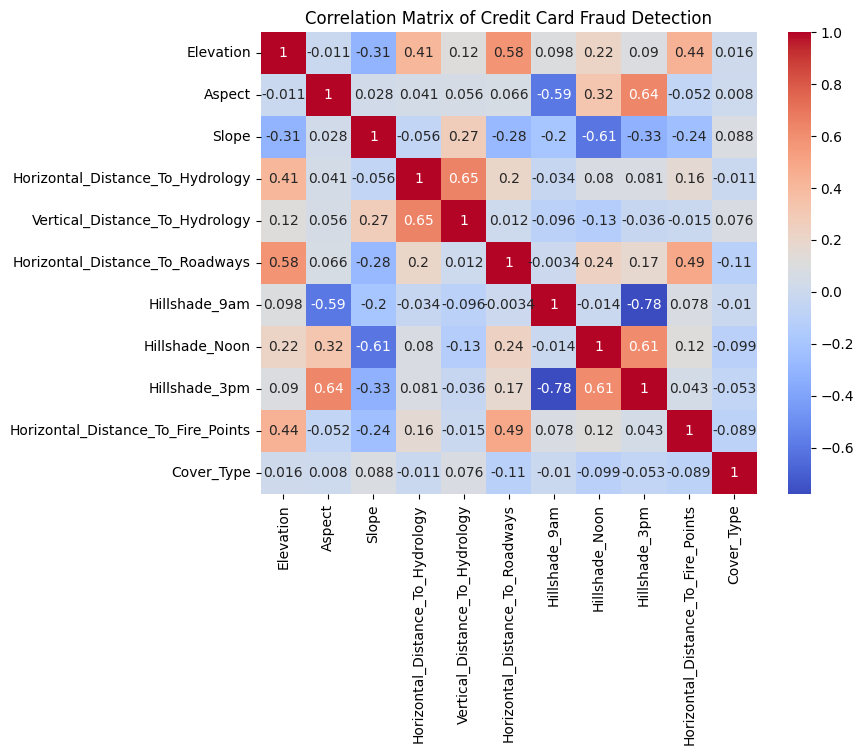

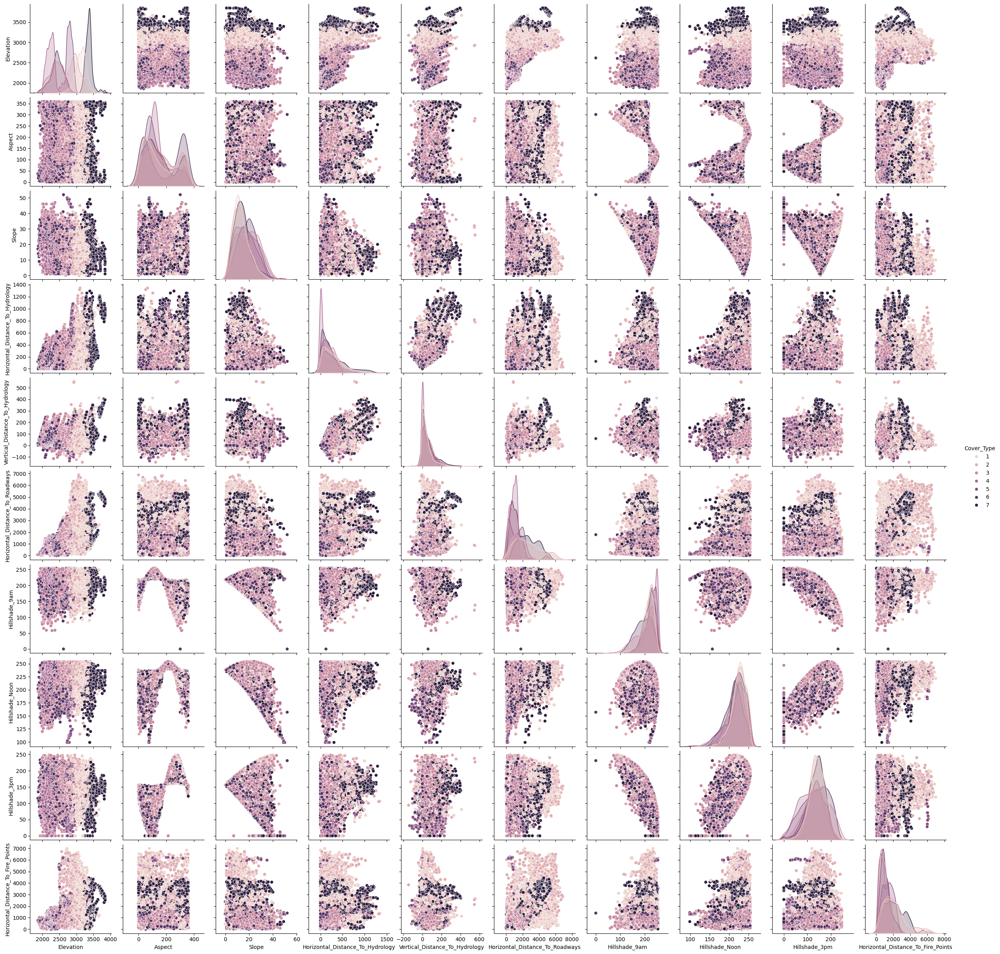

In [43]:
name = 'Credit Card Fraud Detection'
show_plot(df, name)

In [47]:
def determine_number_of_components(explained_variance_ratio):
    # Метод Кайзера
    kaiser_criterion = np.sum(explained_variance_ratio >= 1.0)
    
    # Метод ломанной трости
    cumulative_variance = np.cumsum(explained_variance_ratio)
    elbow_point = np.argmax(np.diff(cumulative_variance) < 0.05) + 1
    
    return kaiser_criterion, elbow_point
    
def perform_pca_and_visualize_no128(dataset, labels, a, show_vectors=False):
    size = dataset.shape[0]
    
    pca = PCA()
    standardized_data = (dataset - np.mean(dataset, axis=0)) / np.std(dataset, axis=0)
    components = pca.fit_transform(standardized_data)
    explained_variance_ratio = pca.explained_variance_ratio_
    explained_variance_ratio = explained_variance_ratio * len(explained_variance_ratio) / np.sum(explained_variance_ratio)

    kaiser_criterion, elbow_point = determine_number_of_components(explained_variance_ratio)

    print(f"Number of components by Kaiser criterion: {kaiser_criterion}")
    print(f"Number of components by Elbow method: {elbow_point}")
    
    # Scree plot
    plt.figure(figsize=(8, 5))
    plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), pca.explained_variance_ratio_, marker='o', linestyle='--')
    plt.title(f"Scree Plot for Dataset {size}x{2}")
    plt.xlabel("Principal Component")
    plt.ylim([0, 1])
    plt.ylabel("Explained Variance Ratio")
    plt.grid()
    plt.show()

    # Visualization function for principal components
    def plot_principal_components(data, labels, components_range, title, vectors=False):
        a_max = np.max(np.abs(data[:, components_range[0]])) * 1.25
        b_max = np.max(np.abs(data[:, components_range[1]])) * 1.25 
        data_max = np.max(np.array(a_max, b_max)) * 1.25
        
        plt.figure(figsize=(8, 6))
        if vectors:
            for i, (comp1, comp2) in enumerate(zip(pca.components_[components_range[0]], pca.components_[components_range[1]])):
                plt.arrow(0, 0, comp1 * data_max, comp2 * data_max, color='r', alpha=0.5)
                plt.text(comp1 * 1.2, comp2 * 1.2, f"Var{i+1}", color='r', fontsize=10)

        sns.scatterplot(x=data[:, components_range[0]], y=data[:, components_range[1]], hue=labels, palette='tab10', alpha=0.25)

        plt.title(title)
        plt.xlabel(f"Component {components_range[0] + 1}")
        plt.ylabel(f"Component {components_range[1] + 1}")
        plt.xlim([-data_max, data_max])
        plt.ylim([-data_max, data_max])
        plt.axhline(0, color='gray', linewidth=0.5, linestyle='--')
        plt.axvline(0, color='gray', linewidth=0.5, linestyle='--')
        plt.grid()
        plt.legend()
        plt.show()
    
    # Visualize first a components
    for i in range(1, a + 1):
        plot_principal_components(components, labels, (0, i - 1),
                                  f"Dataset {size}x{2}: PC1 vs PC{i} - {'With' if show_vectors else 'Without'} Variable Vectors",
                                  vectors=show_vectors)

Number of components by Kaiser criterion: 4
Number of components by Elbow method: 9


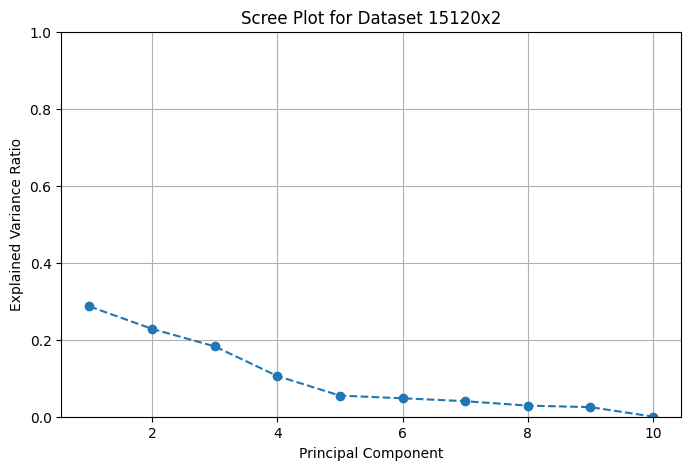

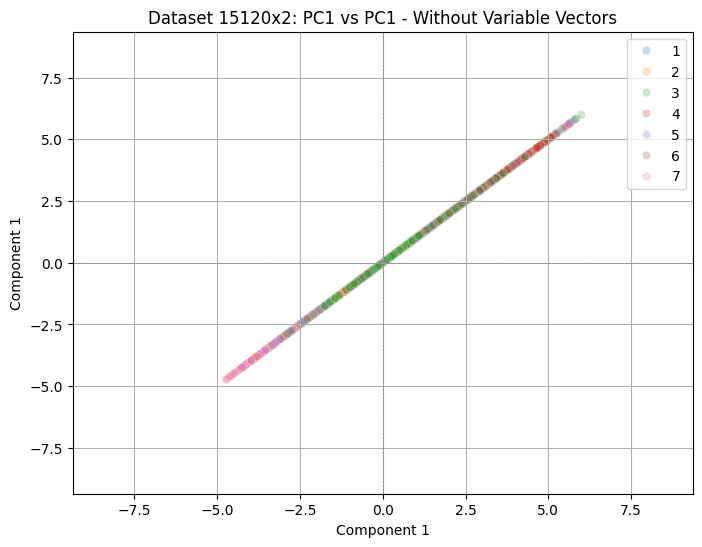

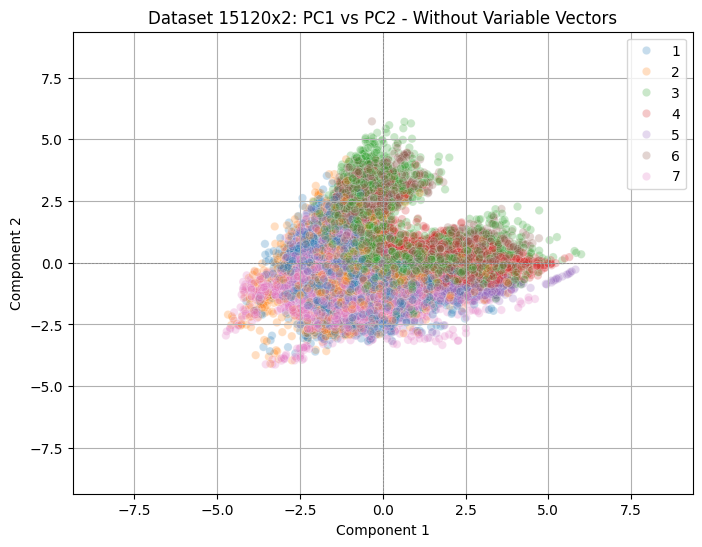

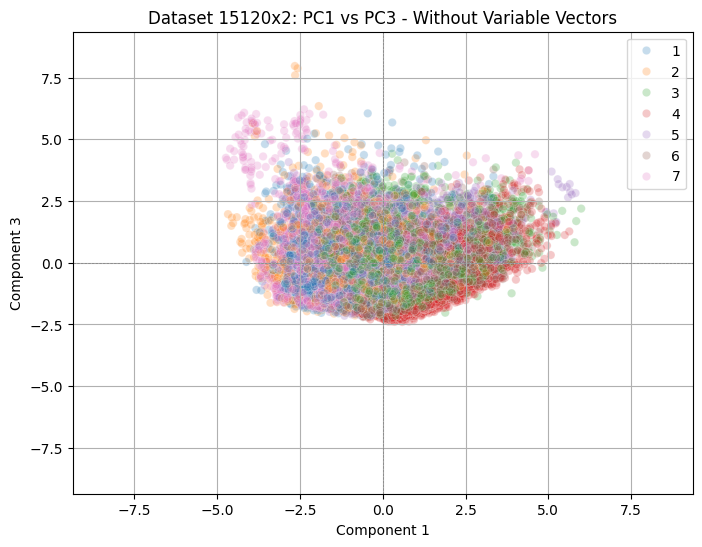

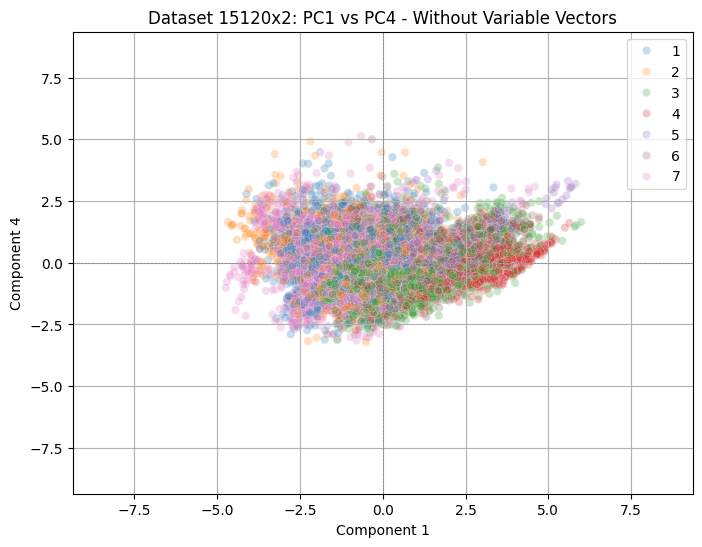

Number of components by Kaiser criterion: 4
Number of components by Elbow method: 9


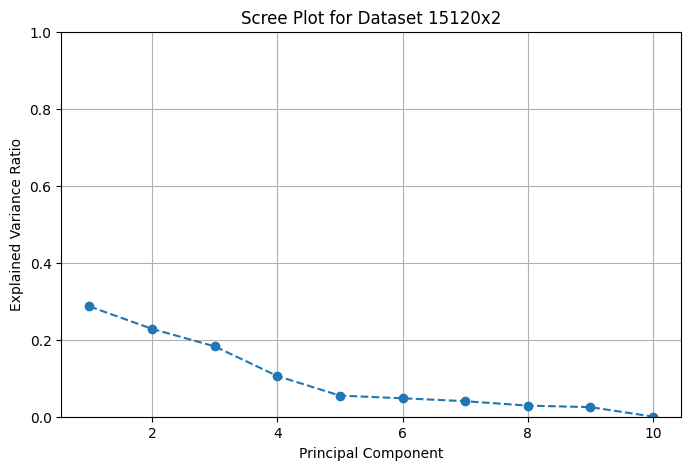

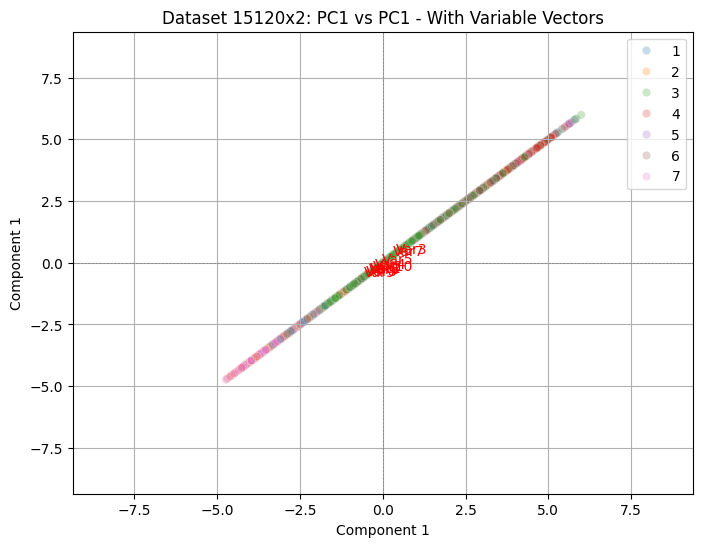

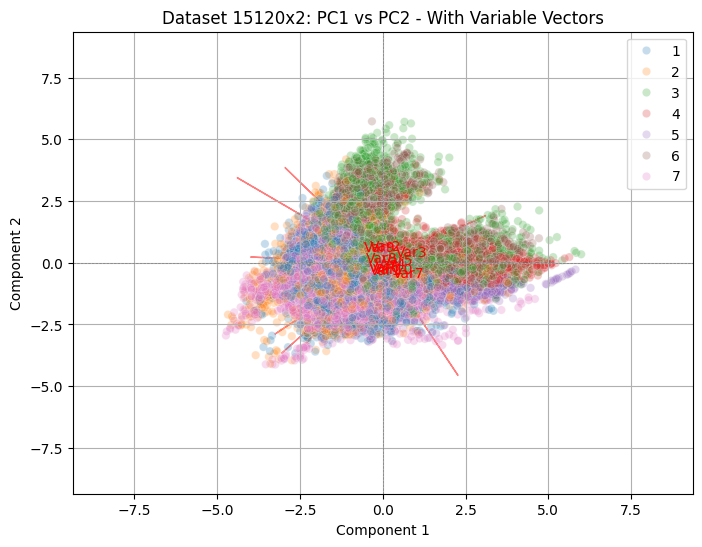

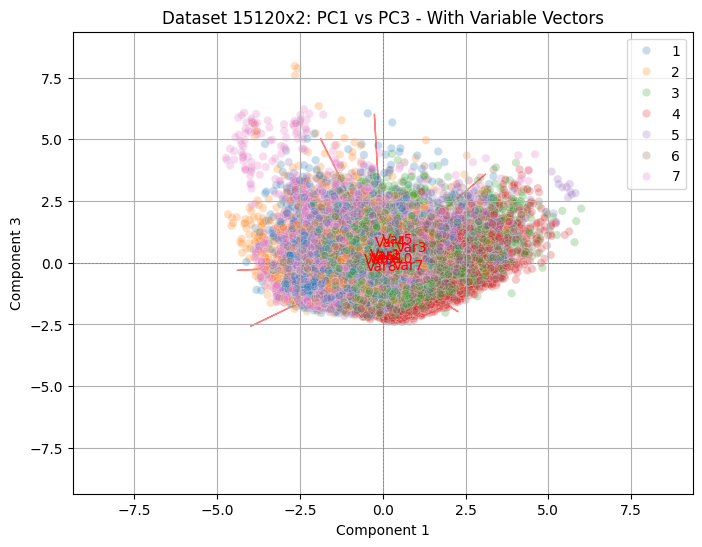

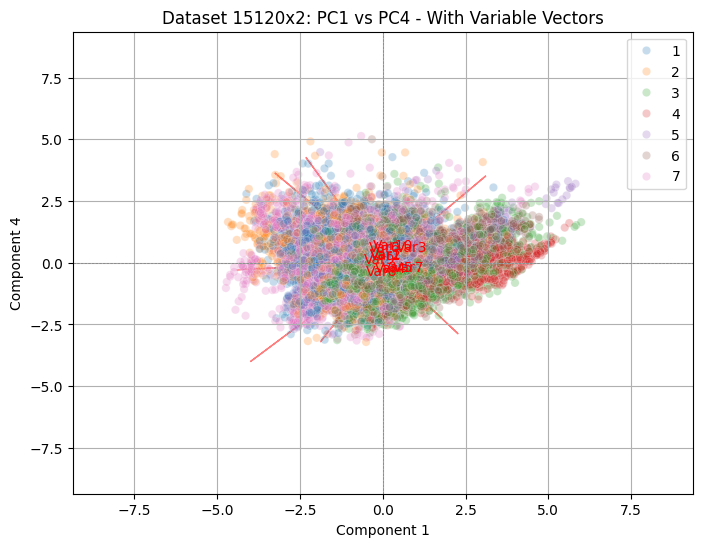

In [49]:
# Parameters for PCA visualization
a = 4  # Number of principal components to visualize

# Visualize for df_new
list_of_labels = ['Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology', 'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways', 'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm', 'Horizontal_Distance_To_Fire_Points']
perform_pca_and_visualize_no128(df[list_of_labels], df['Cover_Type'], a=a, show_vectors=False)
perform_pca_and_visualize_no128(df[list_of_labels], df['Cover_Type'], a=a, show_vectors=True)

C:\Users\root\AppData\Local\Programs\Python\Python310\lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


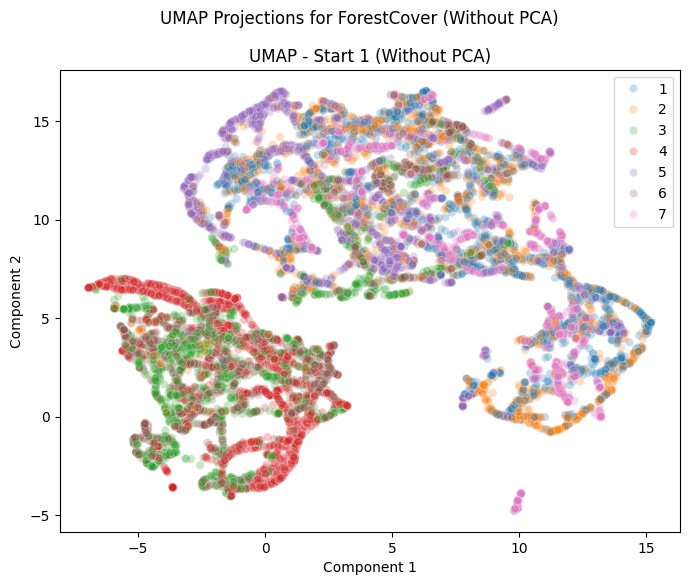

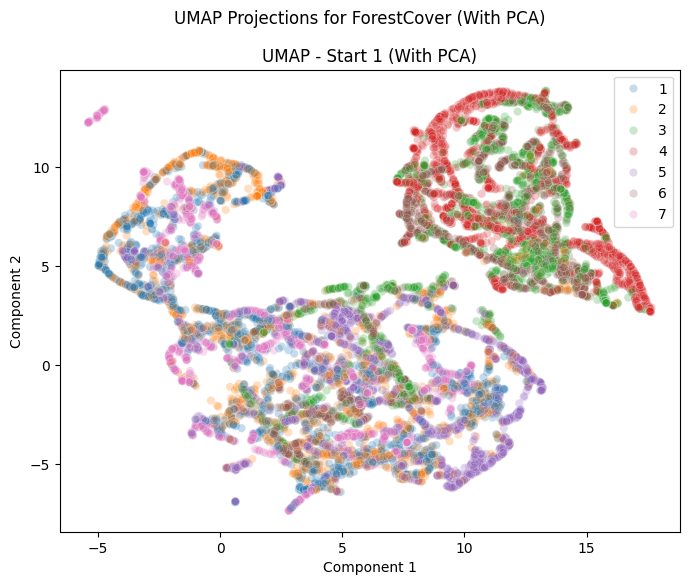

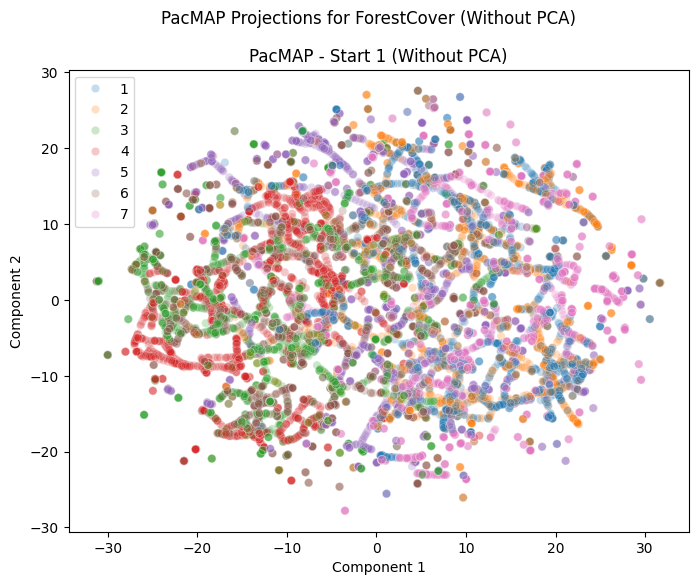

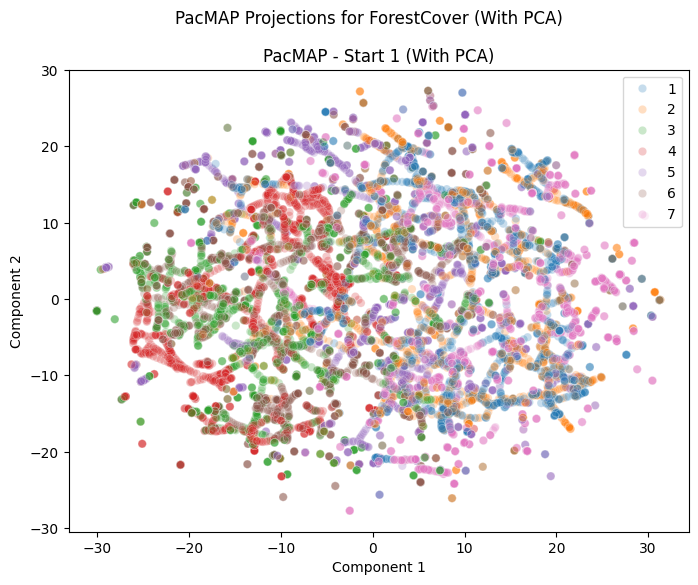

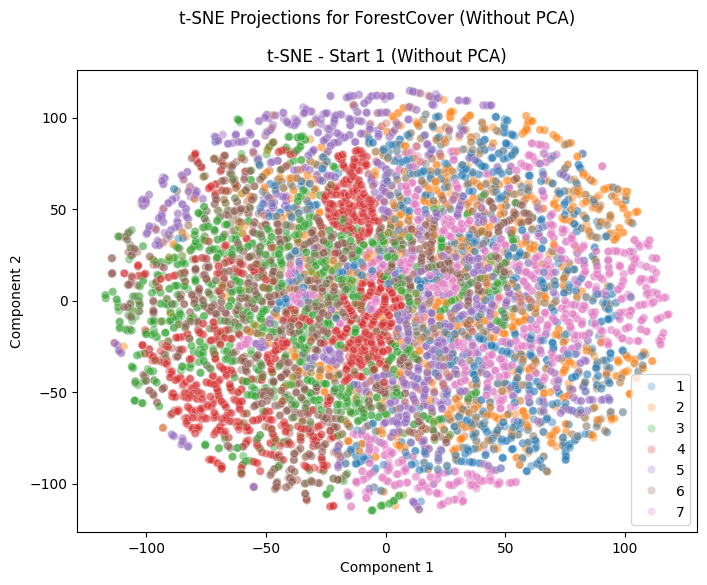

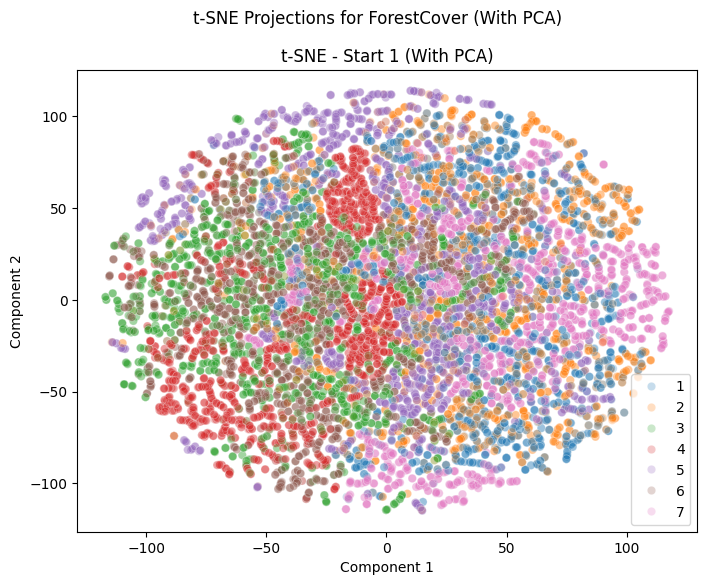

In [60]:
list_of_labels = ['Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology', 'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways', 'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm', 'Horizontal_Distance_To_Fire_Points']
df_pca = perform_pca(df[list_of_labels], 'ForestCover', n_components=10)
visualize_projections_new(df[list_of_labels], df_pca, df['Cover_Type'], 'ForestCover', n_starts=1, n_neighbors=3)